In [1]:
%load_ext autoreload
%autoreload 2

%matplotlib ipympl

import logging

import torch
import torch.nn.functional as F

from pothole.boxes.selective_search import run_selective_search
#from pothole.datasets import PotholeDataset
from pothole.models.resnet import get_resnet_model

logging.basicConfig(level=logging.INFO, format='%(name)s: %(message)s')

In [2]:
#logging.getLogger().setLevel(logging.DEBUG)

In [ ]:
rows, cols = 3, 5
fig, axes = plt.subplots((rows, cols))
fig.canvas.header_visible = False

#for i, 

In [4]:
from pothole.datasets import PotholeRawData, PotholeDataset
raw_data = PotholeRawData()

In [5]:
torch.cuda.set_device(0)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [6]:
import torch.nn as nn
from torchvision.models import resnet50, ResNet50_Weights
def get_dropout_resnet_model(network=resnet50, weights=None, dropout_prob=0.5):
    model = network(weights=weights)

    features = model.fc.in_features
    model.fc = nn.Sequential(
        nn.Dropout(dropout_prob),
        nn.Linear(features, 1),
    )

    return model

In [7]:
model = get_dropout_resnet_model()
model.load_state_dict(torch.load('../data/best_model_4.pt'))
model = model.to(device)

In [4]:
#model_path = '../data/second-model.pth'
#model_path = '../data/first-model.pth'

In [ ]:
model = get_resnet_model()
model.load_state_dict(torch.load(model_path))
model = model.to(device)

## Prediction

In [8]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
#import torchvision.transforms.v2 as transforms
from pothole.datasets import DEFAULT_IMAGE_TRANSFORM, PotholeRawData, load_xml_file
from pothole.prediction import classify_proposals

plt.rcParams['figure.figsize'] = [16.0, 12.0] # default: [6.4, 4.8]

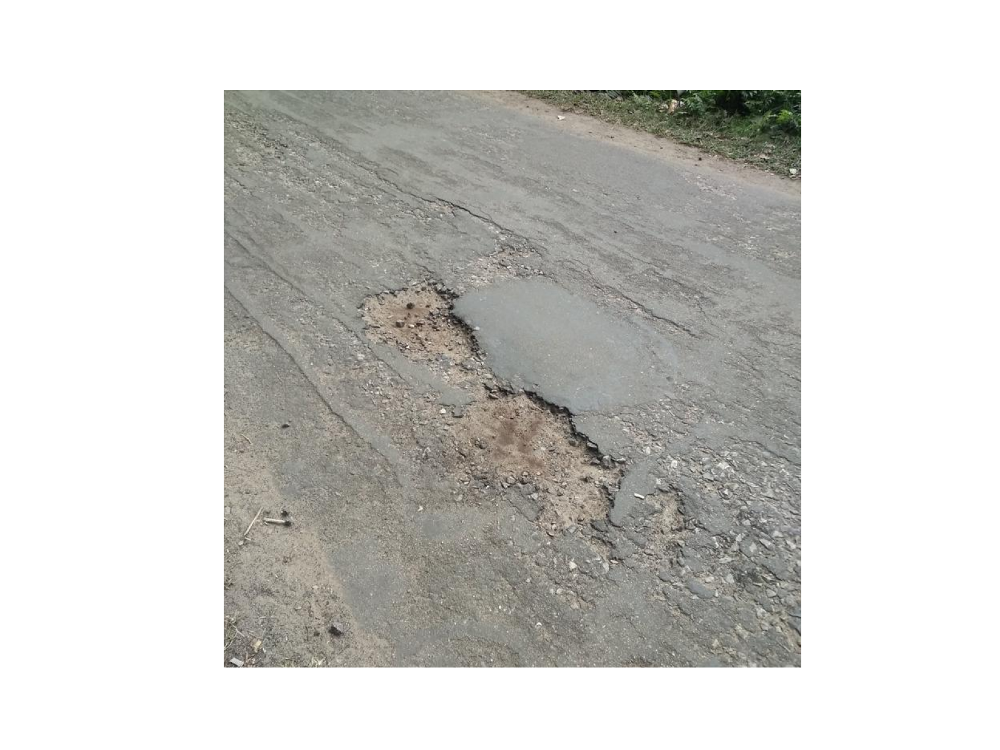

In [55]:
sample_number = 25
xmlname = raw_data.get_subset('test')[sample_number]
image_name, target = load_xml_file(raw_data.get_full_path(xmlname))
image = Image.open(raw_data.get_full_path(image_name))

fig, ax = plt.subplots()
fig.canvas.header_visible = False
ax.imshow(image)
ax.set_axis_off()

In [58]:
proposals = run_selective_search(np.array(image))
len(proposals)

1779

In [59]:
positives = classify_proposals(DEFAULT_IMAGE_TRANSFORM(image).unsqueeze(0).to(device), proposals, model, threshold=0.8)
positives.sort(reverse=True)
display(len(positives))
display(positives[:10])

320

[(0.9237049221992493, array([292, 240, 275, 138], dtype=int32)),
 (0.922130286693573, array([303, 240, 267, 162], dtype=int32)),
 (0.9217244982719421, array([307, 287, 258, 115], dtype=int32)),
 (0.9205871224403381, array([294, 241, 252, 163], dtype=int32)),
 (0.9204856157302856, array([279, 240, 286, 162], dtype=int32)),
 (0.9194647669792175, array([285, 240, 282, 138], dtype=int32)),
 (0.9175125360488892, array([285, 241, 261, 163], dtype=int32)),
 (0.9172295331954956, array([285, 240, 282, 146], dtype=int32)),
 (0.9161344766616821, array([279, 240, 291, 162], dtype=int32)),
 (0.914055585861206, array([285, 240, 303, 146], dtype=int32))]

In [40]:
from torchvision.ops import nms
from pothole.boxes import xywh_to_xyxy
from pothole.plot import show_with_bbs

In [39]:
def show_sample(image, boxes):
#    boxes = list(map(xyxy_to_xywh, targets[sample_number]))

    fig, ax = plt.subplots()

    fig.canvas.header_visible = False
    fig.suptitle(f'Sample {sample_number}\n({len(boxes)} bounding boxes)')

    show_with_bbs(ax, image, boxes)

    ax.set_axis_off()

In [60]:
nms_input = torch.zeros((len(positives), 4))
nms_scores = torch.zeros(len(positives))
for i, (conf, bb) in enumerate(positives):
    nms_scores[i] = conf
    nms_input[i] = torch.tensor(xywh_to_xyxy(bb))
nms_input.to(device)
nms_scores.to(device)
None

tensor([0.9237, 0.9221, 0.9217, 0.9206, 0.9205, 0.9195, 0.9175, 0.9172, 0.9161,
        0.9141, 0.9138, 0.9111, 0.9107, 0.9106, 0.9097, 0.9093, 0.9083, 0.9053,
        0.9046, 0.9034, 0.8987, 0.8973, 0.8967, 0.8957, 0.8954, 0.8953, 0.8950,
        0.8939, 0.8931, 0.8927, 0.8927, 0.8919, 0.8914, 0.8898, 0.8887, 0.8880,
        0.8879, 0.8877, 0.8871, 0.8863, 0.8863, 0.8855, 0.8852, 0.8851, 0.8848,
        0.8847, 0.8843, 0.8834, 0.8827, 0.8814, 0.8808, 0.8808, 0.8807, 0.8804,
        0.8803, 0.8801, 0.8800, 0.8800, 0.8788, 0.8783, 0.8780, 0.8778, 0.8778,
        0.8777, 0.8776, 0.8774, 0.8773, 0.8769, 0.8767, 0.8766, 0.8764, 0.8762,
        0.8761, 0.8758, 0.8757, 0.8754, 0.8754, 0.8752, 0.8750, 0.8746, 0.8736,
        0.8733, 0.8733, 0.8730, 0.8728, 0.8727, 0.8727, 0.8726, 0.8724, 0.8721,
        0.8718, 0.8718, 0.8718, 0.8714, 0.8712, 0.8711, 0.8706, 0.8704, 0.8703,
        0.8699, 0.8698, 0.8696, 0.8693, 0.8692, 0.8688, 0.8687, 0.8681, 0.8678,
        0.8674, 0.8673, 0.8673, 0.8672, 

In [61]:
display(nms_input[:4])
display(nms_scores[:4])

tensor([[292., 240., 567., 378.],
        [303., 240., 570., 402.],
        [307., 287., 565., 402.],
        [294., 241., 546., 404.]])

tensor([0.9237, 0.9221, 0.9217, 0.9206])

In [81]:
nms_result = nms(nms_input, nms_scores, iou_threshold=0.1)
len(nms_result)

12

In [82]:
nms_result

tensor([  0,  12,  21,  58, 113, 142, 188, 212, 234, 258, 275, 304])

In [83]:
prediction = [bb for i, (conf, bb) in enumerate(positives) if i in nms_result]

In [84]:
target

[[159, 230, 331, 352], [270, 368, 498, 547], [523, 498, 580, 558]]

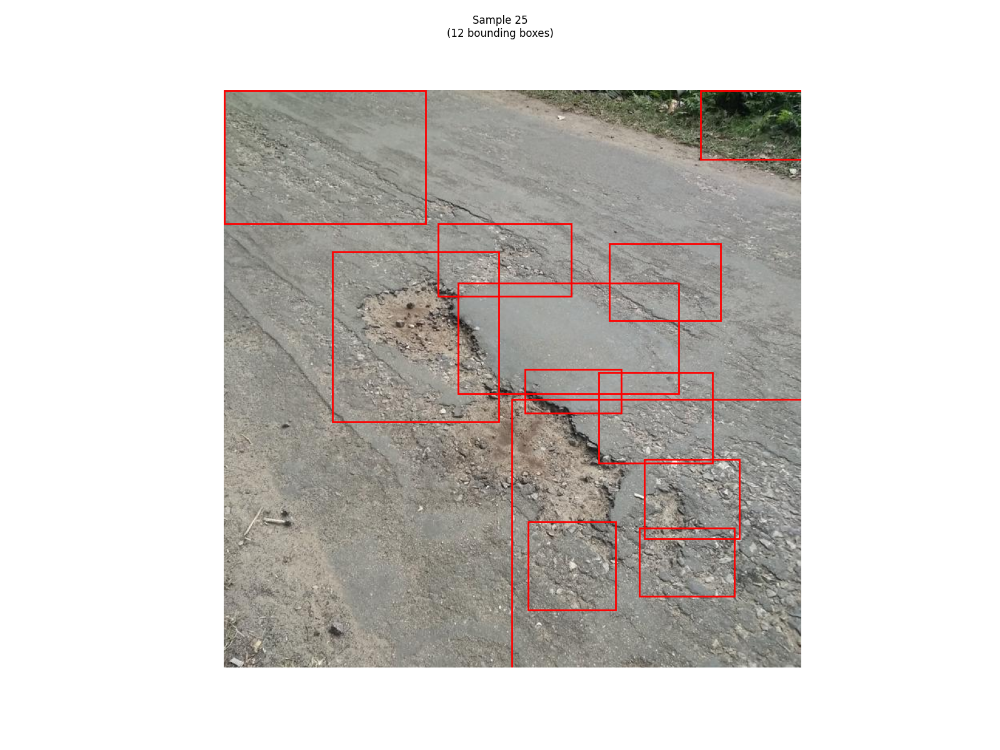

In [85]:
show_sample(image, prediction)

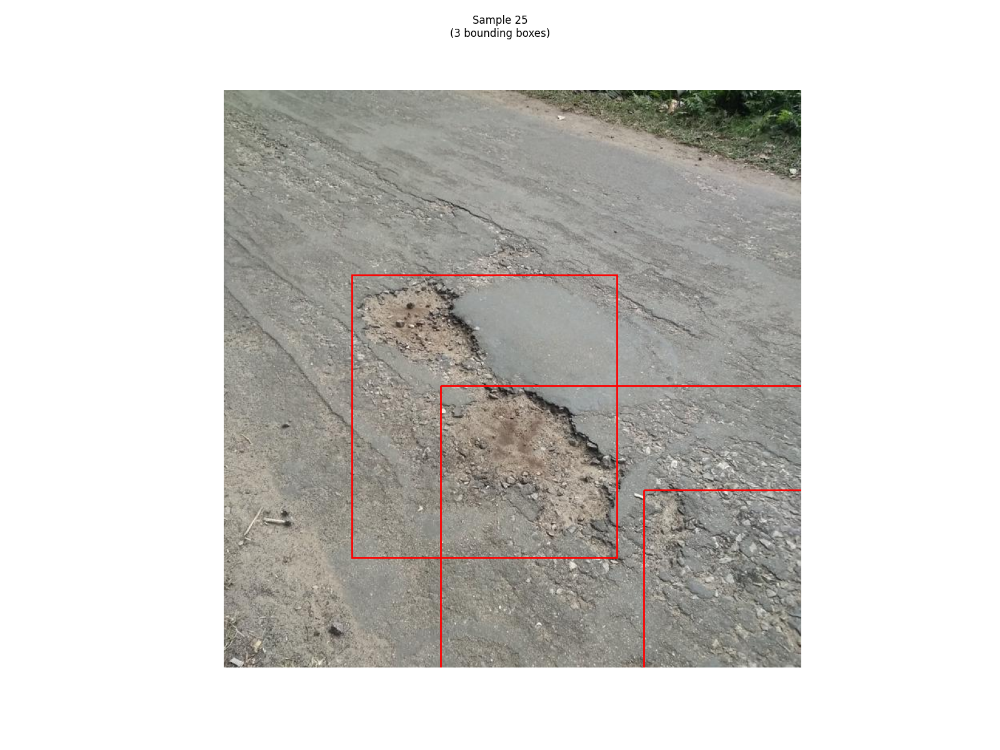

In [67]:
show_sample(image, target)